# Introduction

* __Objective__
 * Build an end-to-end predictive machine learning model that can take any new song we like and predict its genre. 
 
 
* __Goals__
 * Find premade datasets and or curate a training set that's based on Spotify's API for the predictive model. 
 * Implement basic preprocessing & EDA and feature analysis (engineering, selection, etc).
 * Develop a model that shows good intelligence in genre prediction, also include a random baseline model for comparison. 
 * Assess which genres were better predicted and which ones didn't do as well.
 * Build a __prediction function__ that you can give a song title __and__ artist to that's capable of querying Spotify's API to drive a predictive guess on what the genre could be.
 
 
* __Initial Questions__
    * What are the average tempo & energy, key for different genres?
    * What about the most popular songs, in each genre, and what's their tempo & energy?
    * Can a song's musical elements (valence, loudness, instrumentalness, bpm) strongly indicate whether or not it belongs to a specific genre?

In [1]:
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import math as mt
import plotly.express as px

In [2]:
data = pd.read_csv("spotify_code_jam.csv")
# data = pd.read_csv("/Users/monte/Desktop/dataset.csv")

## Data Wrangling

In [3]:
# this function retrieves info on...
def dataset_info(df):
    # Potential Dups
    print("..... Duplicate Rows .....")
    print(f'Total Duplicates: {df.duplicated().sum()}\n')

    # A DF's Shape
    print("\n..... DataFrame Shape .....")
    print(f"Rows: {df.shape[0]}, Columns: {df.shape[1]}")
    print("\n")
    
    # Potential missing values 
    print("..... Missing Values .....")
    print(df.isna().sum(), '\n')
    
    # A DF's basic info
    print("..... DataFrame Information .....") 
    df.info()
    print("\n")
     
    # Any particular column's unique values
    print("..... Unique Values per Column .....")
    for column in df.columns:
        unique_vals = df[column].nunique()
        print(f'{column}: {unique_vals} unique values')
    print("\n")

    # A DF's first 10 rows
    print("..... DataFrame Head .....")
    display(df.head(10))
    
    # A DF's 10 Sample rows
    print("..... DataFrame's Sampled Rows .....")
    display(df.sample(10))
    return

In [4]:
def mins_rounded(seconds):
    duration = seconds / 1000
    return mt.ceil(duration)
data['secs_rounded'] = data['duration_ms'].apply(mins_rounded)

In [5]:
dataset_info(data)

..... Duplicate Rows .....
Total Duplicates: 0


..... DataFrame Shape .....
Rows: 114000, Columns: 22


..... Missing Values .....
Unnamed: 0          0
track_id            0
artists             1
album_name          1
track_name          1
popularity          0
duration_ms         0
explicit            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
track_genre         0
secs_rounded        0
dtype: int64 

..... DataFrame Information .....
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 114000 entries, 0 to 113999
Data columns (total 22 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Unnamed: 0        114000 non-null  int64  
 1   track_id          114000 non-null  object 
 2   artists           113999 no

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre,secs_rounded
0,0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,...,0,0.1430,0.0322,0.000001,0.3580,0.7150,87.917,4,acoustic,231
1,1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,...,1,0.0763,0.9240,0.000006,0.1010,0.2670,77.489,4,acoustic,150
2,2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,...,1,0.0557,0.2100,0.000000,0.1170,0.1200,76.332,4,acoustic,211
3,3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,...,1,0.0363,0.9050,0.000071,0.1320,0.1430,181.740,3,acoustic,202
4,4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,...,1,0.0526,0.4690,0.000000,0.0829,0.1670,119.949,4,acoustic,199
5,5,01MVOl9KtVTNfFiBU9I7dc,Tyrone Wells,Days I Will Remember,Days I Will Remember,58,214240,False,0.688,0.4810,...,1,0.1050,0.2890,0.000000,0.1890,0.6660,98.017,4,acoustic,215
6,6,6Vc5wAMmXdKIAM7WUoEb7N,A Great Big World;Christina Aguilera,Is There Anybody Out There?,Say Something,74,229400,False,0.407,0.1470,...,1,0.0355,0.8570,0.000003,0.0913,0.0765,141.284,3,acoustic,230
7,7,1EzrEOXmMH3G43AXT1y7pA,Jason Mraz,We Sing. We Dance. We Steal Things.,I'm Yours,80,242946,False,0.703,0.4440,...,1,0.0417,0.5590,0.000000,0.0973,0.7120,150.960,4,acoustic,243
8,8,0IktbUcnAGrvD03AWnz3Q8,Jason Mraz;Colbie Caillat,We Sing. We Dance. We Steal Things.,Lucky,74,189613,False,0.625,0.4140,...,1,0.0369,0.2940,0.000000,0.1510,0.6690,130.088,4,acoustic,190
9,9,7k9GuJYLp2AzqokyEdwEw2,Ross Copperman,Hunger,Hunger,56,205594,False,0.442,0.6320,...,1,0.0295,0.4260,0.004190,0.0735,0.1960,78.899,4,acoustic,206


..... DataFrame's Sampled Rows .....


,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre,secs_rounded
46245,46245,3MCsJ80r4QxeWBFEG2bUPG,Charly Lownoise;Mental Theo,Gabber Top 25 (The Best Happy Hardcore Hits Ever),Wonderful Days,22,331572,False,0.558,0.920,...,1,0.0722,0.010100,0.927000,0.9940,0.113,173.886,4,happy,332
90056,90056,2QfiRTz5Yc8DdShCxG1tB2,Chuck Berry,Berry Is On Top,Johnny B. Goode,76,161560,False,0.534,0.803,...,1,0.0743,0.741000,0.000061,0.3070,0.969,167.983,4,rock-n-roll,162
104774,104774,5R8LaP3fPOrj7bRmdG4nKy,MARLENA,bailamorena,bailamorena,57,168434,False,0.479,0.673,...,1,0.0531,0.000568,0.000061,0.0930,0.747,151.799,4,spanish,169
27843,27843,5D7pD5fOlgvT9U9VmGVzEm,Maduk;Diamond Eyes,Liquicity Drum & Bass 2019,Colours,16,273828,False,0.370,0.925,...,0,0.0436,0.000716,0.000302,0.1420,0.119,174.998,4,drum-and-bass,274
19907,19907,7mldq42yDuxiUNn08nvzHO,Sam Hunt,Body Like A Back Road,Body Like A Back Road,72,165386,False,0.732,0.458,...,1,0.0311,0.447000,0.000000,0.1360,0.661,98.938,4,country,166
85929,85929,4D6OlZ47aLApvEF9Hc5yAy,boom boom kid,Smiles from Chapanoland,Perfume de Vos,35,92013,False,0.583,0.823,...,1,0.0359,0.002510,0.000000,0.0810,0.828,102.983,4,punk-rock,93
75584,75584,7uqmKlDXkAoVJDM9grjCNz,Nightnoise,Pure Nightnoise,Toys Not Ties,22,237106,False,0.260,0.126,...,0,0.0410,0.959000,0.419000,0.1250,0.130,74.000,4,new-age,238
88356,88356,7nYUn0gAvdNIXcI9UA3EoF,Justin Quiles;Robin Schulz,Happy Pop Vibes,AEIOU,0,161880,False,0.689,0.856,...,0,0.0813,0.049300,0.000000,0.2320,0.706,126.108,4,reggae,162
47374,47374,6QDbGdbJ57Mtkflsg42WV5,Van Halen,1984 (Remastered),Hot for Teacher - 2015 Remaster,71,282746,False,0.552,0.947,...,1,0.1500,0.000652,0.000250,0.0637,0.465,127.631,4,hard-rock,283
67659,67659,0DBBQaDg8YPePplq7m7Cah,Kevin Roldan,Clásicos de ahora: Perreo,PPP,0,129332,False,0.798,0.625,...,1,0.1300,0.383000,0.000033,0.1250,0.774,92.994,4,latin,130


### Checking for Duplicate and Missing Values

In [6]:
data[data['artists'].isna()]

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre,secs_rounded
65900,65900,1kR4gIb7nGxHPI3D2ifs59,NaN,NaN,NaN,0,0,False,0.501,0.583,...,0,0.0605,0.69,0.00396,0.0747,0.734,138.391,4,k-pop,0


### Renaming Columns

In [7]:
data.columns

Index(['Unnamed: 0', 'track_id', 'artists', 'album_name', 'track_name',
       'popularity', 'duration_ms', 'explicit', 'danceability', 'energy',
       'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature',
       'track_genre', 'secs_rounded'],
      dtype='object')

In [8]:
data = data.rename(
columns = {
    "Unnamed: 0": 'unnamed_0',
    "album_name": "album",
    "artists": "artist",
    "track_genre": "genre",
})

In [9]:
data.columns

Index(['unnamed_0', 'track_id', 'artist', 'album', 'track_name', 'popularity',
       'duration_ms', 'explicit', 'danceability', 'energy', 'key', 'loudness',
       'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'time_signature', 'genre', 'secs_rounded'],
      dtype='object')

### Dropping Columns

In [10]:
data = data.dropna()
data = data.drop(columns=['unnamed_0', 'track_id'], axis=1)
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 113999 entries, 0 to 113999
Data columns (total 20 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   artist            113999 non-null  object 
 1   album             113999 non-null  object 
 2   track_name        113999 non-null  object 
 3   popularity        113999 non-null  int64  
 4   duration_ms       113999 non-null  int64  
 5   explicit          113999 non-null  bool   
 6   danceability      113999 non-null  float64
 7   energy            113999 non-null  float64
 8   key               113999 non-null  int64  
 9   loudness          113999 non-null  float64
 10  mode              113999 non-null  int64  
 11  speechiness       113999 non-null  float64
 12  acousticness      113999 non-null  float64
 13  instrumentalness  113999 non-null  float64
 14  liveness          113999 non-null  float64
 15  valence           113999 non-null  float64
 16  tempo             11

## Exploratory Data Analysis

Given there are 114 genres with each having 1,000 songs (excluding kpop having 999), I will use the parent genres and ignore the sub-, child genres (i.e. pop: k-pop, j-pop, power-pop, rock: alt-rock, punk-rock, hard-rock, rock-and-roll etc).
* Thus simplfying it down to 5 genres: Pop, Rock, Hip-Hop, R&B, and EDM and;
* Reduce the genres' length down to 120 songs per genre, totaling to 600 rows of data -- from 114k rows.

In [11]:
g = data['genre'].nunique()
g

114

### This is the 5 Genre Samples: Pop, Rock, Hip-Hop, R&B and EDM

In [12]:
main_genres = ['pop', 'rock', 'hip-hop', 'r-n-b', 'edm']

def filter_genre(df, genres):
    return df[df['genre'].isin(genres)]

filtered_df = filter_genre(data, main_genres) #this takes the function above and filters the sub-genres away from main ones

sampled_df = [] #this is the actual filtering for-loop
for genre in main_genres:
    genre_df = filtered_df[filtered_df['genre'] == genre]  # filters the genres
    sampled_songs = genre_df.sample(n=1000, random_state=12345)  # Get 120 songs per genre
    sampled_df.append(sampled_songs)

new_df = pd.concat(sampled_df)
print(new_df.shape)

(5000, 20)


In [13]:
# new_g = new_df['genre'].unique()
# new_g

In [14]:
# # sanity check bar chart
# g = new_df.drop(columns=['artist', 'album','explicit', 'duration_ms'], axis=1)
# genres = g.groupby('genre')['track_name'].count().sort_values()
# genres.plot(kind='bar', edgecolor='black')
# plt.title("Genre ")
# plt.xlabel("Range of Songs that are Danceable")
# plt.ylabel("Number of Songs")
# plt.show()

In [15]:
# dataset_info(new_df)

In [16]:
music_magic = new_df.drop(columns=['artist', 'album', 'track_name','explicit', 'genre', 'duration_ms'], axis=1)
music_magic.describe()

# # notes
# # On a scale from 0-100; the avg popularity for a song is at 36.
# # On a scale of 0-1; the avg danceability is 0.63%
# # On a scale of 0-1; the avg energy is at 0.66%
# # On a scale of 0-1; the avg valence/happiness a song has is at 0.53
# # On a scale of 0-243; the avg is 123 bpm (this is a moderate standard tempo)
# # On a scale of 43-594 (in seconds | but 43 seconds to 9m 54s); the avg is 218 seconds (3 mins 38s)
# # ig we're going with genre, popularity, danceability and tempo? -- I need to do a correlation matrix

,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,secs_rounded
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,35.211000,0.634562,0.672473,5.577200,-6.483982,0.590400,0.083971,0.246388,0.018184,0.195713,0.538947,122.018826,3.919600,212.232000
std,32.249956,0.142871,0.176301,3.553106,2.546820,0.491809,0.082168,0.255212,0.091282,0.166621,0.229626,28.819037,0.383621,57.005288
min,0.000000,0.112000,0.000071,0.000000,-24.843000,0.000000,0.023200,0.000010,0.000000,0.017900,0.034100,51.037000,1.000000,43.000000
25%,0.000000,0.543000,0.556750,2.000000,-7.878500,0.000000,0.036100,0.034275,0.000000,0.094475,0.364000,99.934250,4.000000,175.000000
50%,42.000000,0.647000,0.692500,6.000000,-6.098000,1.000000,0.050300,0.143000,0.000001,0.129000,0.535000,121.960000,4.000000,204.000000
75%,66.000000,0.735000,0.810000,9.000000,-4.653000,1.000000,0.092200,0.411000,0.000153,0.258000,0.717000,140.006000,4.000000,240.000000
max,100.000000,0.964000,0.994000,11.000000,0.681000,1.000000,0.924000,0.983000,0.984000,0.989000,0.994000,214.016000,5.000000,621.000000


On a scale from 0 to 100, the average popularity of a song is 36. In terms of danceability, the average score is 0.63, while the average energy level is slightly higher at 0.66. The average valence, which measures the happiness of a song, is recorded at 0.53. When examining tempo, the average beats per minute (BPM) is 123, representing a moderate standard tempo. Lastly, the average song duration is 218 seconds, or approximately 3 minutes and 38 seconds, within a range of 43 seconds to 9 minutes and 54 seconds.

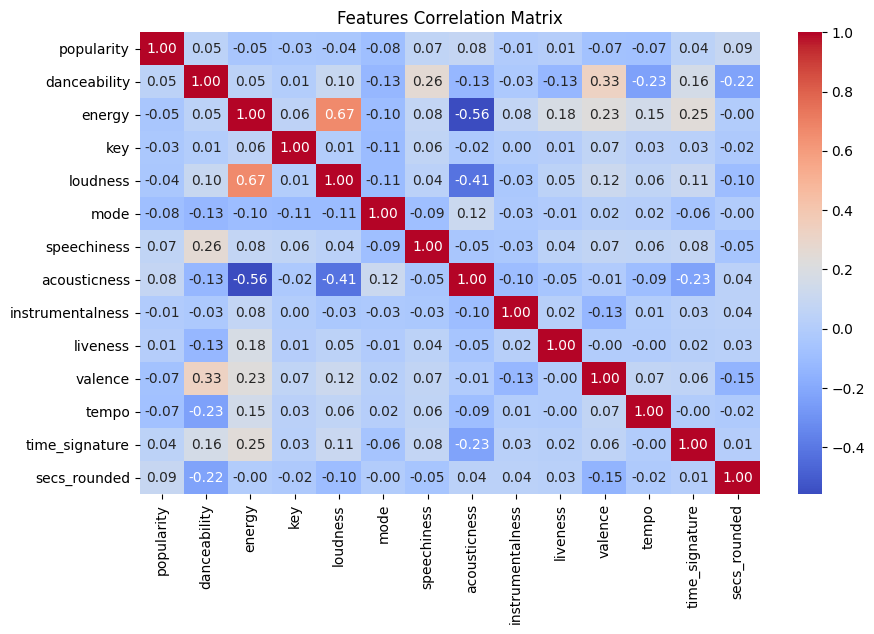

In [17]:
music_matrix = music_magic.corr()
plt.figure(figsize=(10, 6))
sns.heatmap(music_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Features Correlation Matrix')
plt.show()

# this interactive plotly matrix works
# fig = px.imshow(music_matrix_1, aspect="auto")
# fig.show()

#notes
# the 2 strongest correlations I'm seeing is Energy & Loudness + Danceability & Valence.
# So Genre is going to be largest comparison to the other audible features

In [18]:
# this is a curated df meant to showcase the numerical data visually based on genres' features
visuals = new_df.drop(columns=['artist', 'album'], axis=1)

# segmented genres
p_visuals = visuals[visuals['genre'] == 'pop'] 
# r_visuals = visuals[visuals['genre'] == 'rock'] 
# hh_visuals = visuals[visuals['genre'] == 'hip-hop'] 
# rnb_visuals = visuals[visuals['genre'] == 'r-n-b'] 
# edm_visuals = visuals[visuals['genre'] == 'edm']

In [19]:
# fig = px.scatter(visuals, x="energy", y="loudness",
# 	         size="key", color="genre",
#                  hover_name="valence", log_x=True, size_max=15, title='Energy and Loudness Grouped by Genre') #changing the size_max scales the circles' sizes
# fig.show()

In this scatterplot it visualizes songs between energy and loudness. The circle size of each scatter point is determined by the key of the song. The higher key values represents songs with higher key values and the smaller circles represent songs with lower key values.

The trend with this scatterplot seems to be a positive relationship between energy and loudness, which makes sense since high energy songs are often louder, and low energy songs tend to be softer.  

In [20]:
fig = px.bar(visuals, x="genre", y="key", color="explicit", title="Explicit Lyrics by Genre")
fig.show()

After analyzing the bar graphs for the genres we are working with, it becomes clear that there is a distinct difference between songs with explicit lyrics and those without. The data shows that the hip-hop genre has the highest number of songs containing explicit lyrics, while the rock genre features significantly fewer explicit tracks.

I want to create a full visual analysis (pie chart, smth else) but also respectively for all 5 genres in the form of a function. 
analyzing them from a -- key(bar), energy, loudness, tempo (histogram), danceability, valence(pie)

## All 5 Genre Line-Ups

### Pop Visuals

In [21]:
fig = px.scatter(p_visuals, x="energy", y="loudness",
	         size="key", color="valence",
                 hover_name="genre", log_x=True, size_max=30, title='Energy vs Loudness of Songs Categorized by Valence') #changing the size_max scales the circles' sizes
fig.show()

In [22]:
p_visuals['valence'].describe()

count    1000.000000
mean        0.506223
std         0.212209
min         0.038300
25%         0.344000
50%         0.498000
75%         0.678250
max         0.969000
Name: valence, dtype: float64

In this scatter plot, we examine the relationship between energy and loudness, categorized by the valence of the songs. Valence refers to the mood of the song, with higher values indicating happier emotions and lower values suggesting sadder or more negative moods.

In our dataset, the mean valence for pop songs is approximately 0.5177, indicating a generally positive mood. Additionally, 75% of the pop songs have a valence of 0.67425 or lower, which shows that a significant portion of pop songs tends to be more upbeat.

This analysis suggests that energy and loudness are correlated with the valence of the songs, helping to identify their emotional content.

In [23]:
fig = px.sunburst(p_visuals, path=['explicit', 'key', 'tempo'], values='popularity',
                  title='Pop Genre Popularity Scale - Categorized by the Lyrical Explicitness, their keys and tempo')
#the values here start from center to outer and its popularity is viewed via hovering.
fig.show()

In the sunburst chart we created, it visualizes the lyrical explicitness, key, and tempo of songs. The songs are divided into non-explicit, represented by blue, and explicit songs, represented by red. Most songs are categorized as non-explicit, as this occupies the majority of the chart. The chart is divided into three sections: the center categorizes the songs by explicitness (non-explicit or explicit), the second layer represents the keys of the songs, and the third layer illustrates the tempo of the songs.

### Rock Genre

In [24]:
# fig = px.scatter(r_visuals, x="energy", y="loudness",
# 	         size="key", color="valence",
#                  hover_name="genre", log_x=True, size_max=30, title='Energy vs Loudness of Songs Categorized by Valence') #changing the size_max scales the circles' sizes
# fig.show()

In [25]:
# r_visuals['valence'].describe()

In this scatter plot, we also compare the energy of the songs to their loudness, categorized by the valence of the songs. As shown by the visual and the descriptive statistics, the average valence for rock songs is approximately 0.547992, indicating a generally positive mood. Additionally, 75% of the rock songs have a valence of 0.699250 or lower, suggesting that most rock songs tend to be upbeat. In contrast, 25% of the songs have a valence of 0.369750, indicating that a portion of rock songs may convey more negative or sadder emotions.

In [26]:
# fig = px.sunburst(r_visuals, path=['explicit', 'key', 'tempo'], values='popularity',
#                   title='Rock Genre Popularity Scale - Categorized by the Lyrical Explicitness, their keys and tempo')
# #the values here start from center to outer and its popularity is viewed via hovering.
# fig.show()

We also created a sunburst chart to visualize the lyrical explicitness, key, and tempo for the rock genre. The center of the sunburst chart represents the explicitness of the songs, categorized as explicit (red) and non-explicit (blue). As you can see, most of the songs in the rock genre are categorized as non-explicit. The second layer represents the key of the songs, ranging from 0 to 11, while the outer layer displays the tempo of the songs.

### Hip-Hop Genre

In [27]:
# fig = px.scatter(hh_visuals, x="energy", y="loudness",
# 	         size="key", color="valence",
#                  hover_name="genre", log_x=True, size_max=30, title='Energy vs Loudness of Songs Categorized by Valence in Hip-Hop') #changing the size_max scales the circles' sizes
# fig.show()

In [28]:
# hh_visuals['valence'].describe()

According to the scatter plot we created, the darker colors represent lower valence, while the lighter colors indicate higher valence for hip-hop songs. You can see that most of the songs are in lighter colors, suggesting they have a higher valence. Hip-hop songs have a mean valence of approximately 0.569016, with 75% of the songs having a valence of 0.744250. Compared to the previous genres, this indicates that hip-hop has a more positive mood than both rock and pop.

In [29]:
# fig = px.sunburst(hh_visuals, path=['explicit', 'key', 'tempo'], values='popularity',
#                   title='Hip-Hop Genre Popularity Scale - Categorized by the Lyrical Explicitness, their keys and tempo')
# #the values here start from center to outer and its popularity is viewed via hovering.
# fig.show()

In this sunburst chart, we compared lyrical explicitness with key and tempo. Although hip-hop has a higher valence than rock and pop, we can observe that this genre contains more than 25% of songs with explicit lyrics.

### R&B Genre

In [30]:
# fig = px.scatter(rnb_visuals, x="energy", y="loudness",
# 	         size="key", color="valence",
#                  hover_name="genre", log_x=True, size_max=30, title='Energy vs Loudness of Songs Categorized by Valence in RnB Genre') #changing the size_max scales the circles' sizes
# fig.show()

In [31]:
# rnb_visuals['valence'].describe()

he R&B genre exhibits a more scattered pattern compared to the previous charts (hip-hop, rock, and pop). According to the visual provided, 75% of the songs in the R&B genre have a valence of 0.81, indicating that most of the songs convey a more positive mood. In contrast, 25% of the songs have a valence of 0.43, suggesting that a portion of R&B songs may have a darker or more negative emotional tone.

In [32]:
# fig = px.sunburst(rnb_visuals, path=['explicit', 'key', 'tempo'], values='popularity',
#                   title='RnB Genre Popularity Scale - Categorized by the Lyrical Explicitness, their keys and tempo')
# #the values here start from center to outer and its popularity is viewed via hovering.
# fig.show()

In [33]:
# rnb_visuals['key'].describe()

In [34]:
# rnb_visuals['tempo'].describe()

In this sunburst chart created for the R&B genre, we can see that the majority of the songs do not have explicit lyrics. The average key for R&B songs is 5.7, which suggests that songs in a higher key may sound brighter and more energetic, while those in a lower key may sound deeper and more relaxed. Notably, 75% of the songs have a key value of 9 or higher, indicating a tendency towards more energetic keys, while 25% of the songs have a key value of 2, suggesting that a portion of the songs is more relaxed.

Regarding tempo, 75% of the R&B songs have a tempo of 140 BPM or higher, which is considered a high tempo (over 120 BPM). Conversely, 25% of the songs have a lower tempo, generally considered to be 100 BPM or less.

### EDM Genre

In [35]:
# fig = px.scatter(edm_visuals, x="energy", y="loudness",
# 	         size="key", color="valence",
#                  hover_name="genre", log_x=True, size_max=30, title='Energy vs Loudness for EDM Songs Categorized by Valence') #changing the size_max scales the circles' sizes
# fig.show()

In [36]:
# edm_visuals['valence'].describe()

While comparing energy and loudness by the valence of the songs, we can see that the EDM genre in our dataset has a mean valence of approximately 0.439007, making it the lowest among the genres analyzed. Additionally, 75% of the EDM songs have a valence of 0.62, while 25% have a valence of 0.283500.

In [37]:
# fig = px.sunburst(edm_visuals, path=['explicit', 'key', 'tempo'], values='popularity',
#                   title='EDM Genre Popularity Scale - Categorized by the Lyrical Explicitness, their keys and tempo')
# #the values here start from center to outer and its popularity is viewed via hovering.
# fig.show()

In [38]:
# edm_visuals['key'].describe()

In [39]:
# edm_visuals['tempo'].describe()

In [40]:
# edm_visuals['explicit'].value_counts()

After comparing explicit lyrics, key, and tempo in the EDM genre, we see that there are a total of 109 songs without explicit lyrics and 11 songs that do contain explicit lyrics. This means that approximately 9% of the total EDM songs have explicit lyrics, while 91% do not.

The average key for the EDM genre is 5.62, indicating that most songs fall in the middle range rather than being distinctly high or low. The average tempo of EDM songs is 123.79 BPM, which is considered upbeat, suggesting that the majority of EDM tracks maintain a lively and energetic pace.



### This is the entire Genres Analysis

In [41]:
# # revist this function to include ALL genres | should have at least 113k rows


# main_genres = g

# def filter_genre(df, genres):
#     return df[df['genre'].isin(genres)]

# filtered_df = filter_genre(data, main_genres) #this takes the function above and filters the sub-genres away from main ones

# sampled_df = [] #this is the actual filtering for-loop
# for genre in main_genres:
#     genre_df = filtered_df[filtered_df['genre'] == genre]  # filters the genres
#     sampled_songs = genre_df.sample(n=999, random_state=12345)  # Get 120 songs per genre
#     sampled_df.append(sampled_songs)

# new_df = pd.concat(sampled_df)
# print(new_df.shape)

In [42]:
music_magic_1 = data.drop(columns=['artist', 'album', 'track_name','explicit', 'duration_ms'], axis=1)
music_magic_1.describe()

# notes
# On a scale from 0-100; the avg popularity for a song is at
# On a scale of 0-1; the avg danceability is %
# On a scale of 0-1; the avg energy is at %
# On a scale of 0-1; the avg valence/happiness a song has is at 
# On a scale of 0-243; the avg is  bpm (this is a moderate standard tempo)
# On a scale of XX-XXX
# ig we're going with genre, popularity, danceability and tempo? -- I need to do a correlation matrix

,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,secs_rounded
count,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000
mean,33.238827,0.566801,0.641383,5.309126,-8.258950,0.637558,0.084652,0.314907,0.156051,0.213554,0.474066,122.147695,3.904034,228.513329
std,22.304959,0.173543,0.251530,3.559999,5.029357,0.480708,0.105733,0.332522,0.309556,0.190378,0.259261,29.978290,0.432623,107.298806
min,0.000000,0.000000,0.000000,0.000000,-49.531000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000
25%,17.000000,0.456000,0.472000,2.000000,-10.013000,0.000000,0.035900,0.016900,0.000000,0.098000,0.260000,99.218500,4.000000,175.000000
50%,35.000000,0.580000,0.685000,5.000000,-7.004000,1.000000,0.048900,0.169000,0.000042,0.132000,0.464000,122.017000,4.000000,213.000000
75%,50.000000,0.695000,0.854000,8.000000,-5.003000,1.000000,0.084500,0.597500,0.049000,0.273000,0.683000,140.071000,4.000000,262.000000
max,100.000000,0.985000,1.000000,11.000000,4.532000,1.000000,0.965000,0.996000,1.000000,1.000000,0.995000,243.372000,5.000000,5238.000000


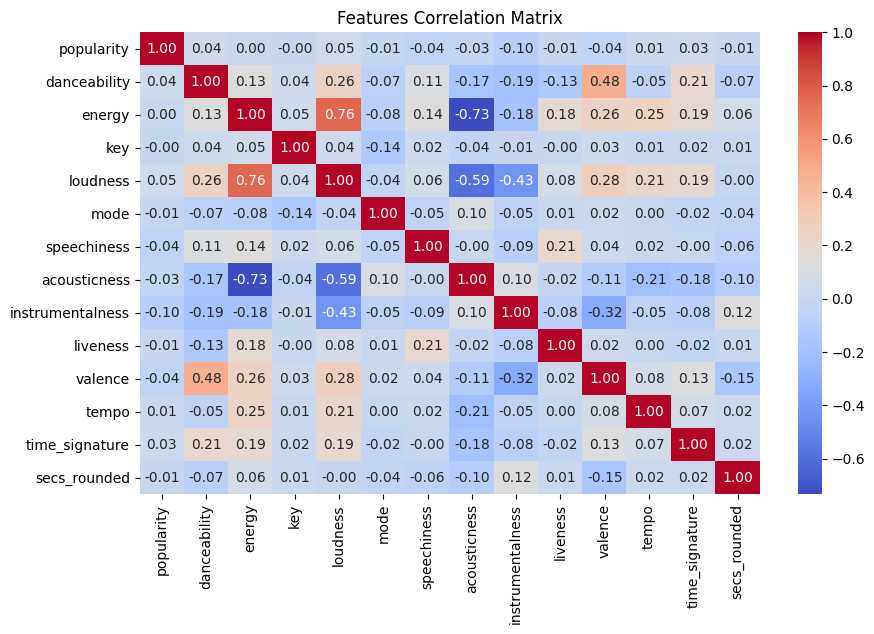

In [43]:
music_matrix_1 = music_magic_1.corr()
plt.figure(figsize=(10, 6))
sns.heatmap(music_matrix_1, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Features Correlation Matrix')
plt.show()

# this interactive plotly matrix works
# fig = px.imshow(music_matrix_1, aspect="auto")
# fig.show()

In [44]:
fig = px.scatter(data, x="energy", y="loudness",
	         size="key", color="genre",
                 hover_name="valence", log_x=True, size_max=15, title='Energy and Loudness Grouped by Genre') #changing the size_max scales the circles' sizes
fig.show()

In [45]:
# fig = px.sunburst(data, path=['explicit', 'key', 'tempo'], values='popularity',
#                   title='EDM Genre Popularity Scale - Categorized by the Lyrical Explicitness, their keys and tempo')
# #the values here start from center to outer and its popularity is viewed via hovering.
# fig.show()

### Danceability

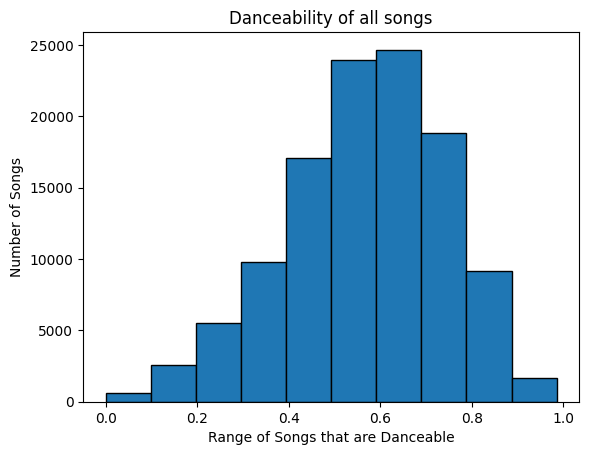

In [46]:
data['danceability'].plot(
kind='hist', edgecolor='black')
plt.title("Danceability of all songs")
plt.xlabel("Range of Songs that are Danceable")
plt.ylabel("Number of Songs")
plt.show()

By creating a histogram of the danceability of the songs, we can observe that it follows a normal distribution. The histogram is bell-shaped, featuring a single peak, with most values clustering around the mean.

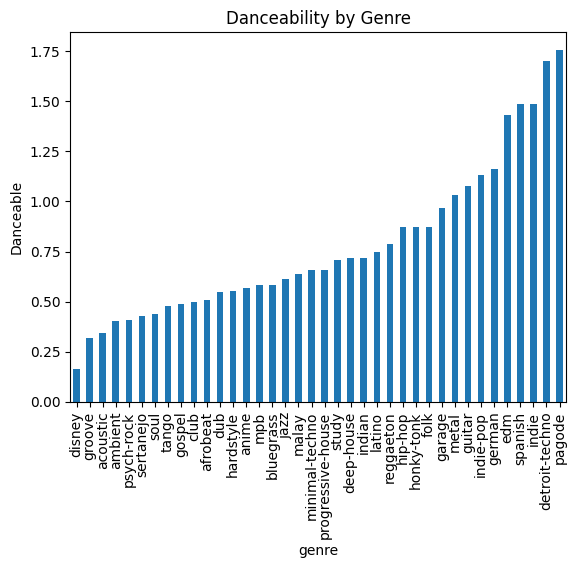

In [47]:
bar_graph = data.sample(50).groupby("genre")["danceability"].sum().sort_values()
bar_graph.plot(kind="bar",
              title="Danceability by Genre",
              ylabel = "Danceable")
plt.show()

After grouping the data by genre, we sampled 50 values to graph the danceability of each genre. The results show that EDM is the most danceable genre, while rock is the least danceable. Additionally, hip-hop has a slight edge over R&B in terms of danceability.

### Loudness

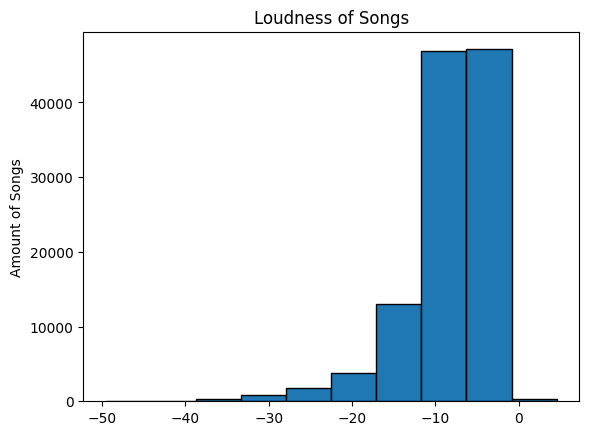

In [48]:
data['loudness'].plot(
kind='hist', edgecolor='black')
plt.title("Loudness of Songs")
plt.ylabel("Amount of Songs")
plt.show()

Considering the loudness of the songs in our dataframe, the histogram demonstrates a normal distribution, characterized by a bell-shaped curve. Most values are concentrated around the mean, indicating that the loudness levels of the songs follow this typical pattern.

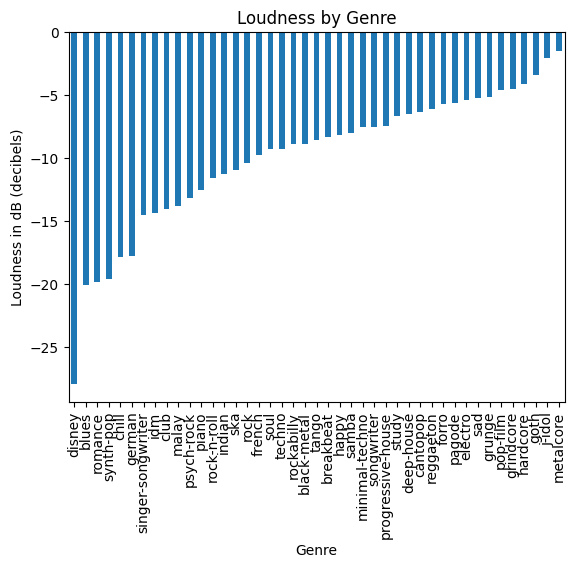

In [49]:
# Sample 50 values and group by genre, summing the loudness
bar_graph = data.sample(50).groupby("genre")["loudness"].sum().sort_values()

# Create a bar graph
bar_graph.plot(kind="bar",
               title="Loudness by Genre",
               ylabel="Loudness in dB (decibels)",
               xlabel="Genre")

# Show the plot
plt.show()


In the histogram above, we plotted the loudness of various genres using decibels (dB) as the measurement tool. The genre with the lowest decibel level is rock, followed by R&B, pop, and hip-hop. The genre with the highest decibel level is EDM.

### Popularity

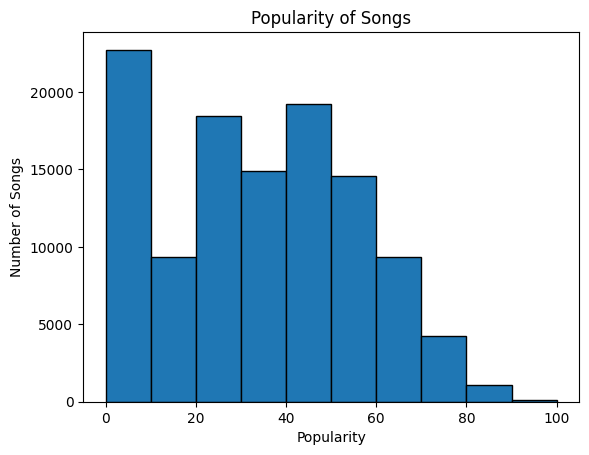

In [50]:
data['popularity'].plot(
    kind='hist', 
    edgecolor='black'
)

# Add title and labels
plt.title("Popularity of Songs")
plt.xlabel("Popularity")
plt.ylabel("Number of Songs")

# Show the plot
plt.show()


Right-skewed: The distribution is skewed to the right, indicating that most songs have a relatively low popularity, while a few songs have exceptionally high popularity.  

Peak: The peak of the histogram is around 0-10, suggesting that the most common range of song popularity is between 0 and 10.


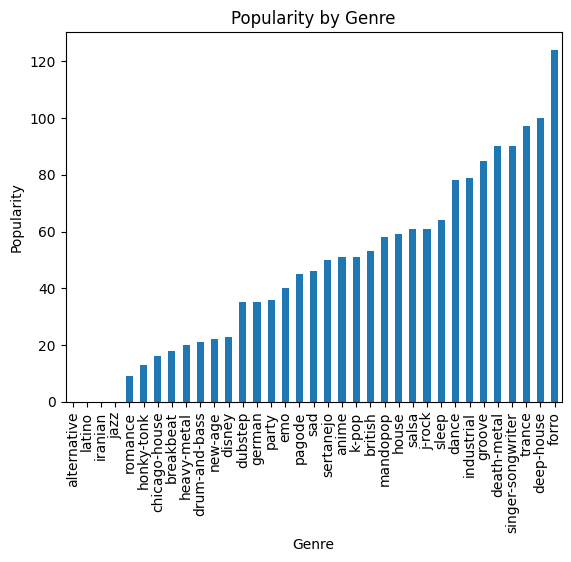

In [51]:

bar_graph = data.sample(50).groupby("genre")["popularity"].sum().sort_values()


bar_graph.plot(kind="bar",
               title="Popularity by Genre",
               ylabel="Popularity",
               xlabel="Genre")

plt.show()



In this dataset, we examined the popularity of different genres based on a sample of 50 rows. The analysis shows that R&B is the most popular genre, followed closely by EDM in second place. Pop ranks third, followed by rock, while hip-hop is the least popular genre in this sample.

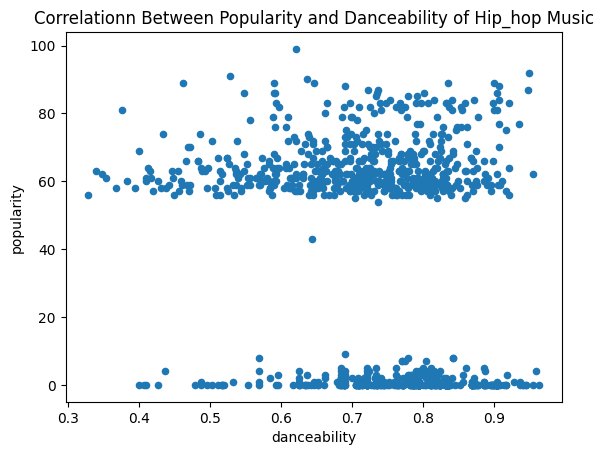

In [52]:
correlation_hiphop = data[data["genre"] == "hip-hop" ]

correlation_hiphop.plot(kind="scatter",
       x="danceability",
       y="popularity",
       ylabel="popularity",
       title="Correlationn Between Popularity and Danceability of Hip_hop Music")
plt.show()

Positive Correlation: There seems to be a general positive correlation between popularity and danceability. This suggests that songs with higher danceability tend to be more popular.  

Outliers: There are a few outliers, especially in the lower popularity range with high danceability. These could be songs that are popular for other reasons besides danceability.  

## Machine Learning

## Conclusion